# Self-Driving Car Engineer Nanodegree
## Project: Advanced Lane Lines Finding

### Import Packages

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline

### Undistort

In [2]:
# Load calibration images.
calibration_fnames = glob.glob('./camera_cal/calibration*.jpg')

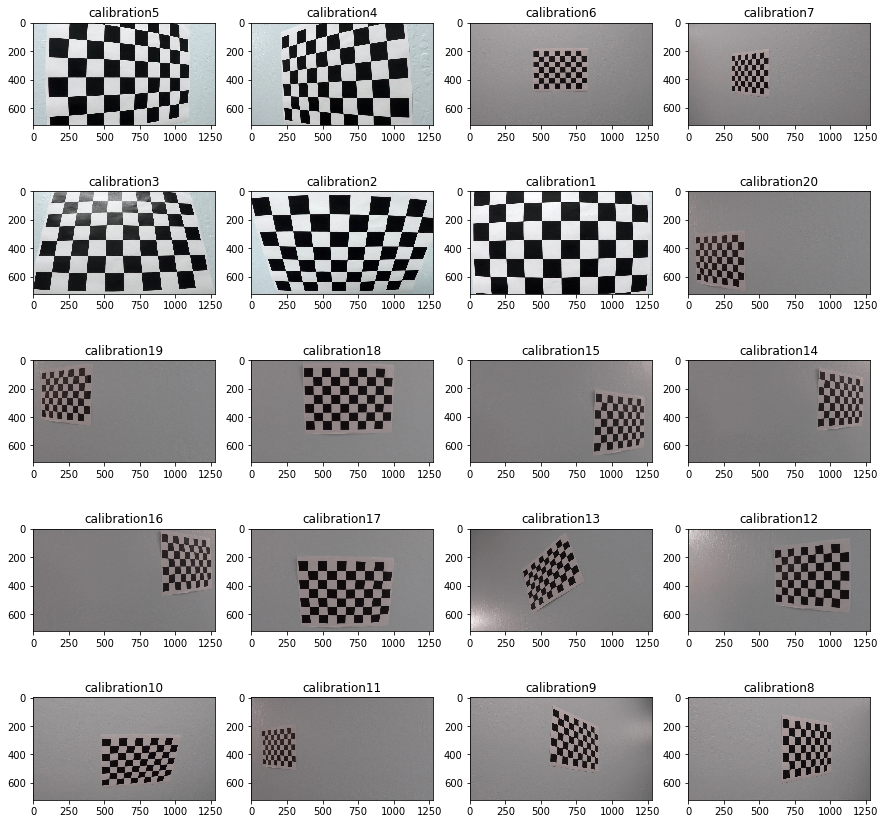

In [3]:
fig, axes = plt.subplots(5, 4, figsize=(15,15))
for ax, idx in zip(axes.flat, range(20)):
    ax.imshow(cv2.imread(calibration_fnames[idx]))
    ax.set_title(calibration_fnames[idx].split('/')[-1][:-4])

In [4]:
objpoints = []
imgpoints = []
objp = np.zeros((6*9, 3), np.float32)
objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)

for fname in calibration_fnames:
    img = mpimg.imread(fname)
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
    
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

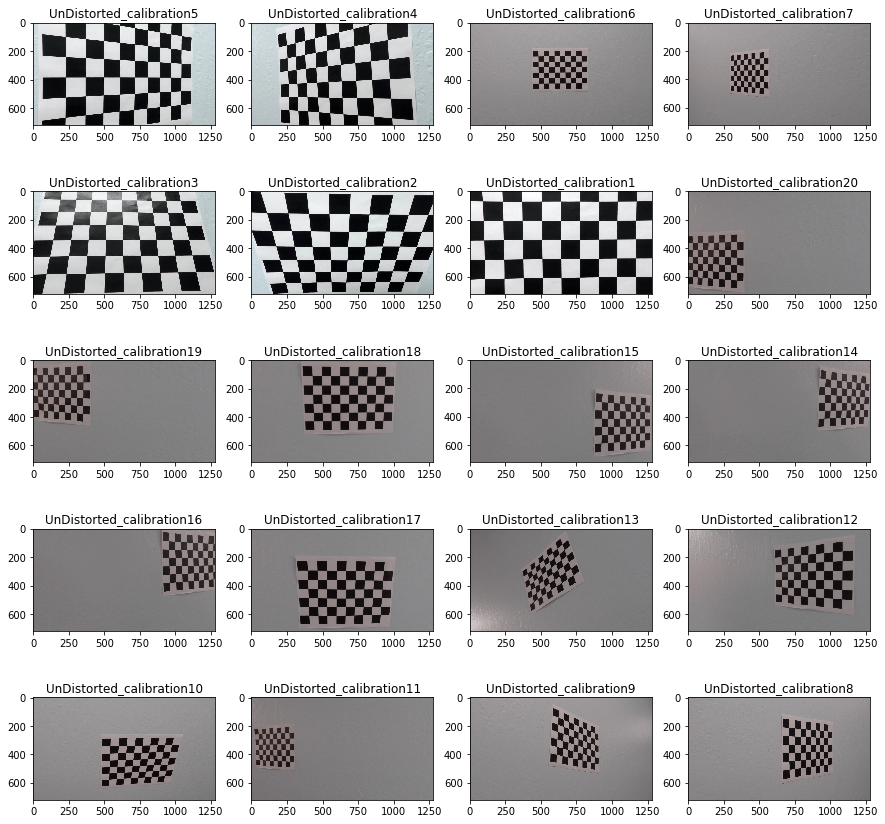

In [5]:
fig, axes = plt.subplots(5, 4, figsize=(15,15))
for ax, idx in zip(axes.flat, range(20)):
    dst = cv2.undistort(cv2.imread(calibration_fnames[idx]), mtx, dist, None, mtx)
    ax.imshow(dst)
    ax.set_title('UnDistorted_' + calibration_fnames[idx].split('/')[-1][:-4])

In [6]:
# Load test images.
test_fnames = glob.glob('./test_images/*.jpg')

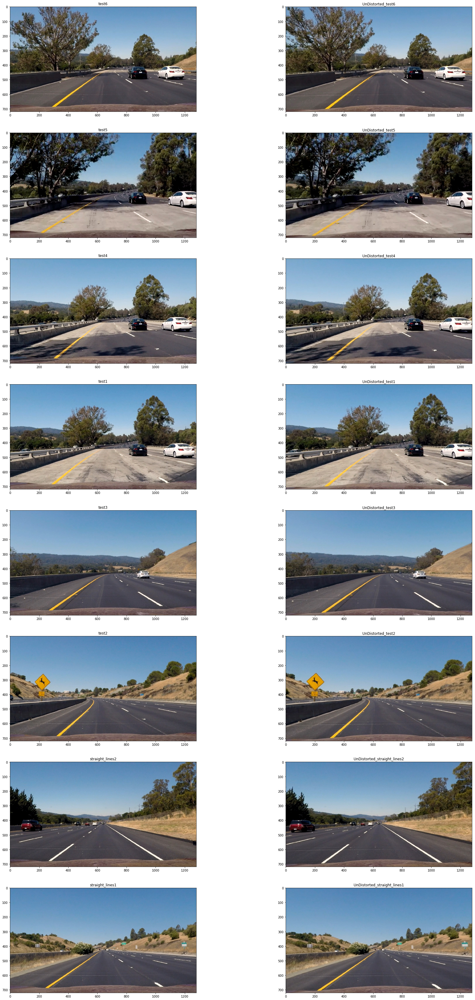

In [7]:
fig, axes = plt.subplots(8, 2, figsize=(30,60))
for ax, idx in zip(axes.flat, range(16)):
    img_num = idx//2
    img = cv2.imread(test_fnames[img_num])
    if idx%2 == 0:
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(test_fnames[img_num].split('/')[-1][:-4])
    else:
        dst = cv2.undistort(img, mtx, dist, None, mtx)
        ax.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
        ax.set_title('UnDistorted_' + test_fnames[img_num].split('/')[-1][:-4])

In [8]:
undistorted = []
for i in range(len(test_fnames)):
    img = cv2.imread(test_fnames[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    undistorted.append(dst)

### Processing Images Using Gradients and Colors

#### Gradients

In [9]:
def abs_sobel_thresh(img, orient='x', thresh=(0, 255), sobel_kernel=3):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    elif orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # Return the result
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

In [10]:
img = undistorted[0]
# Apply each of the thresholding functions
gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(20, 100))
grady = abs_sobel_thresh(img, orient='y', sobel_kernel=3, thresh=(20, 100))
mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(50, 200))
dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))

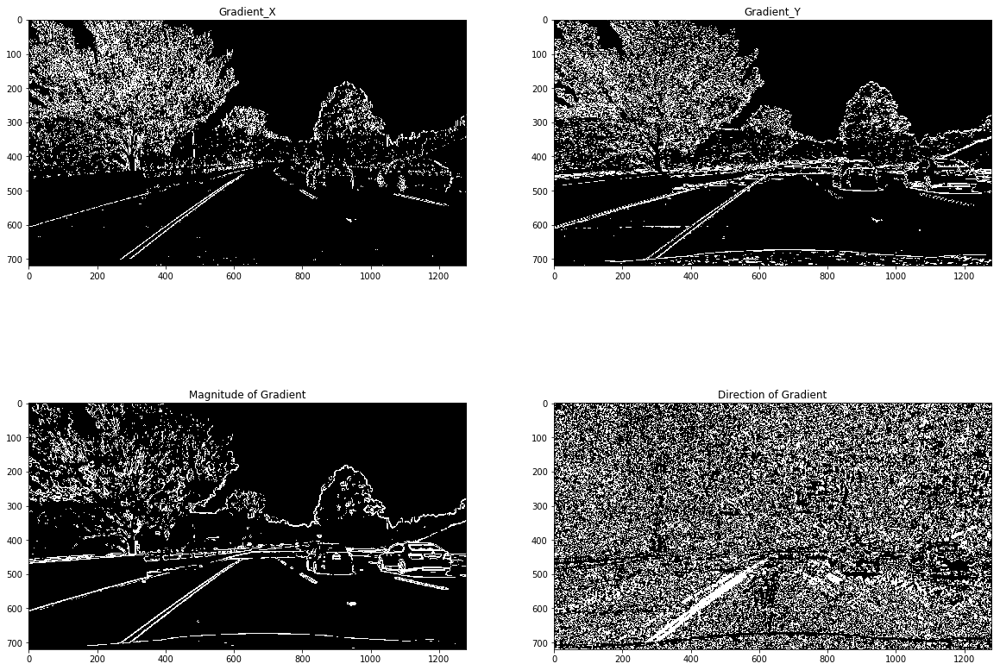

In [11]:
fig, [[ax_gradx, ax_grady], [ax_mag, ax_dir]] = plt.subplots(2, 2, figsize=(20,15))
ax_gradx.imshow(gradx, cmap='gray')
ax_gradx.set_title('Gradient_X')
ax_grady.imshow(grady, cmap='gray')
ax_grady.set_title('Gradient_Y')
ax_mag.imshow(mag_binary, cmap='gray')
ax_mag.set_title('Magnitude of Gradient')
ax_dir.imshow(dir_binary, cmap='gray')
ax_dir.set_title('Direction of Gradient')
plt.show()

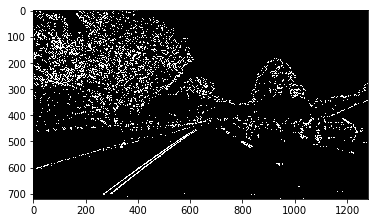

In [12]:
grad_combined = np.zeros_like(dir_binary)
grad_combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
plt.imshow(grad_combined, cmap='gray')

In [13]:
def grad_combine(img):
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(20, 100))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=3, thresh=(20, 100))
    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(50, 200))
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))
    grad_combined = np.zeros_like(dir_binary)
    grad_combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return grad_combined

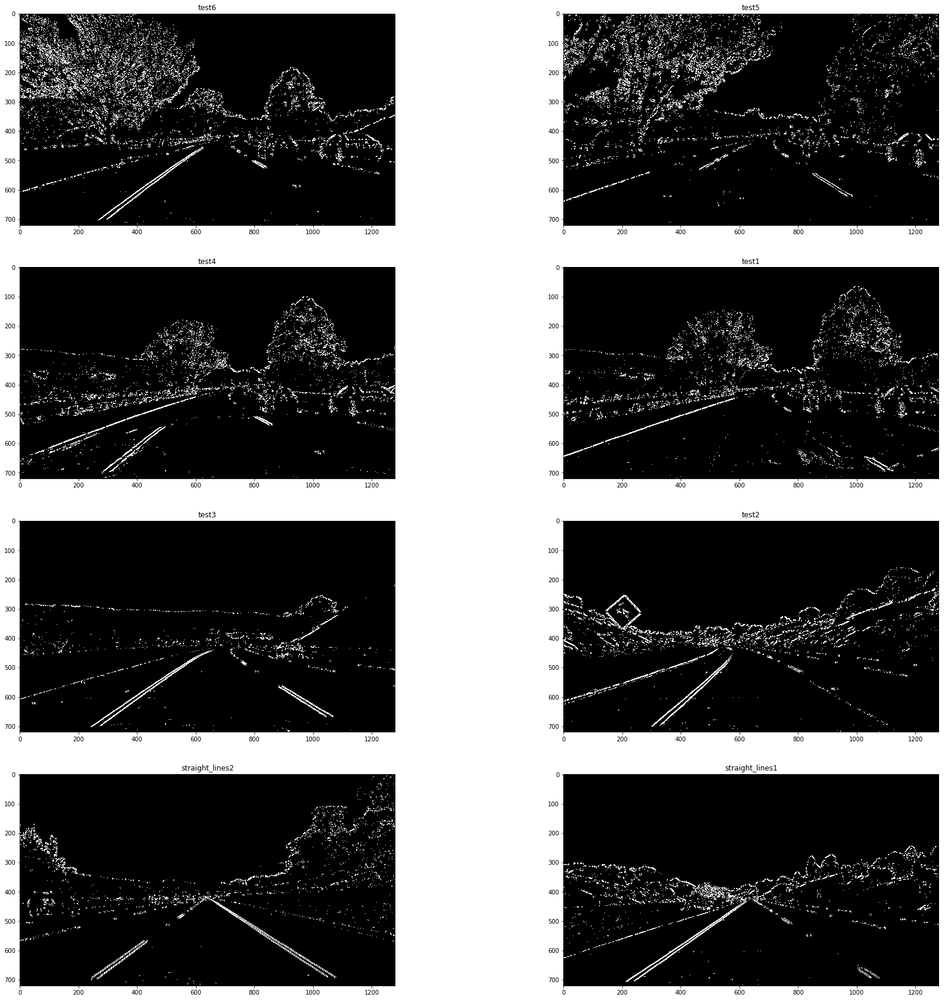

In [14]:
fig, axes = plt.subplots(4, 2, figsize=(30,30))
for ax, idx in zip(axes.flat, range(8)):
    img = undistorted[idx]
    ax.imshow(grad_combine(img), cmap='gray')
    ax.set_title(test_fnames[idx].split('/')[-1][:-4])

#### Color Space

In [15]:
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

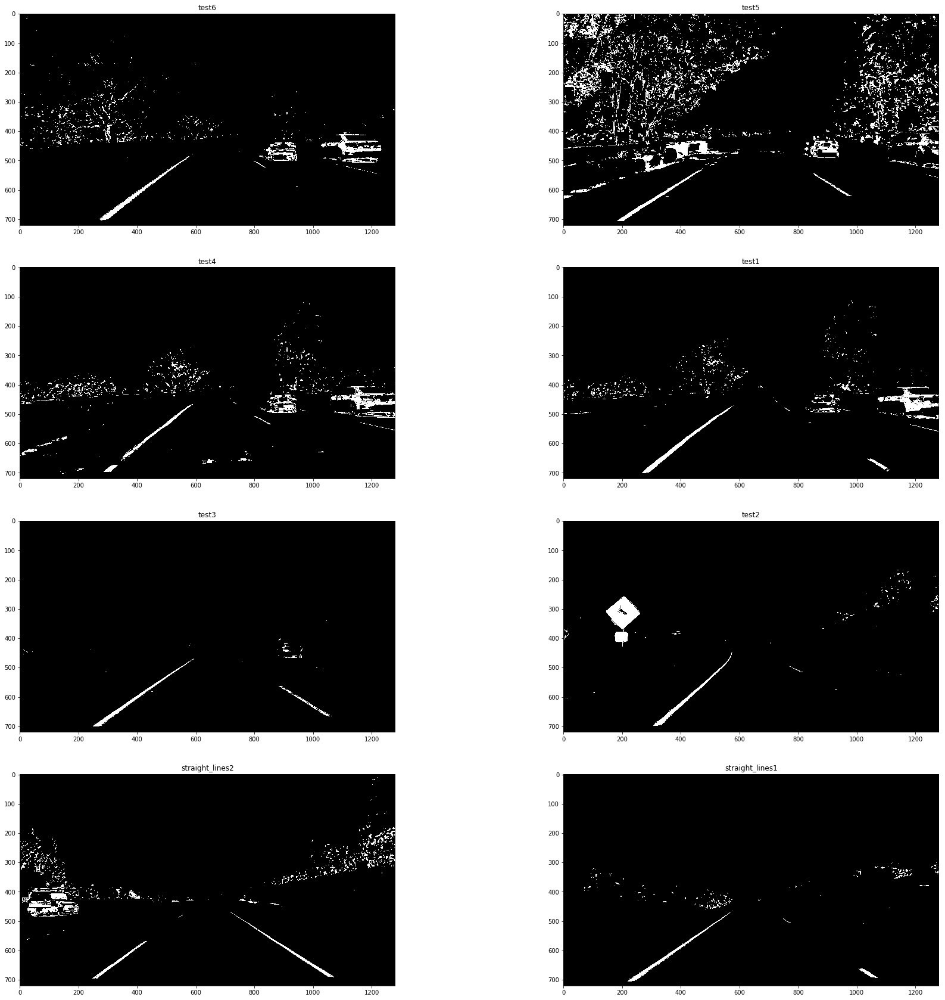

In [16]:
fig, axes = plt.subplots(4, 2, figsize=(30,30))
for ax, idx in zip(axes.flat, range(8)):
    img = undistorted[idx]
    ax.imshow(hls_select(img, thresh=(160,255)), cmap='gray')
    ax.set_title(test_fnames[idx].split('/')[-1][:-4])

In [17]:
def grad_color_combine(img):
    grad_combined = grad_combine(img)
    hls_binary = hls_select(img, thresh=(160, 255))
    
    combined = np.zeros_like(dir_binary)
    combined[(grad_combined == 1) | (hls_binary == 1)] = 1
    return combined

In [18]:
thresholded_binaries = []
for img in undistorted:
    combined = grad_color_combine(img)
    thresholded_binaries.append(combined)

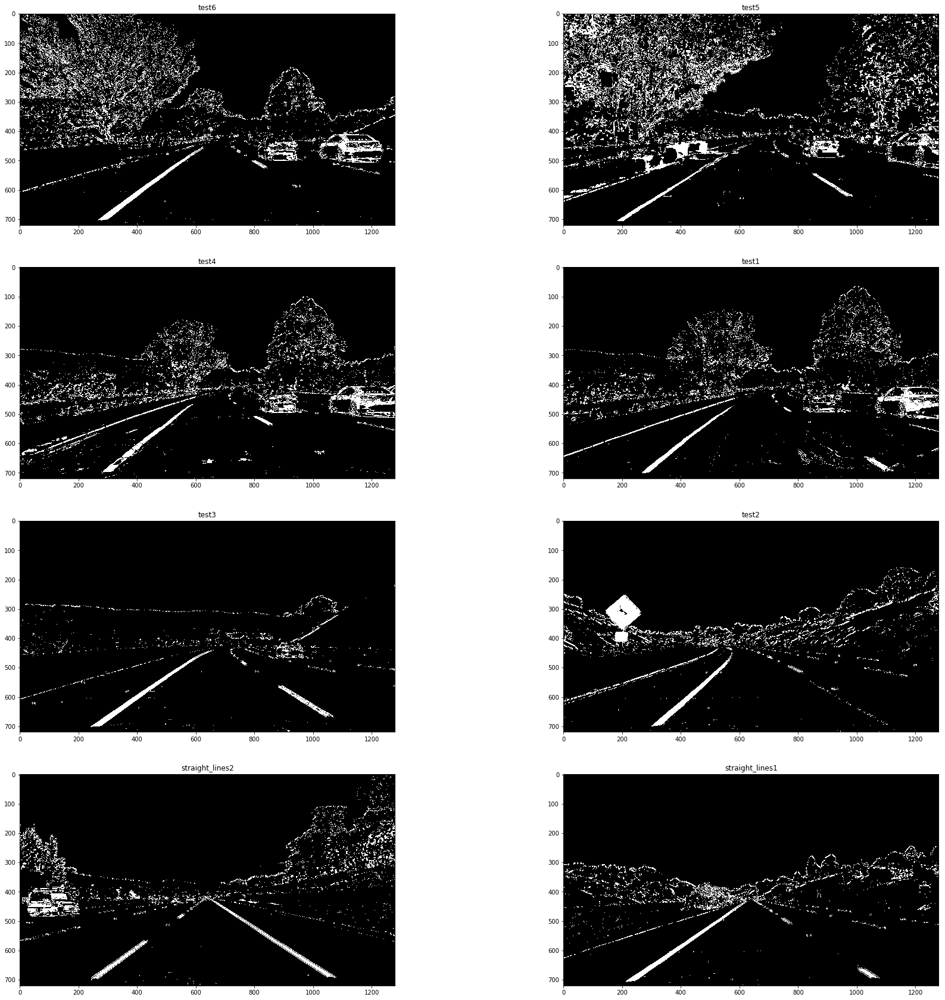

In [19]:
fig, axes = plt.subplots(4, 2, figsize=(30,30))
for ax, idx in zip(axes.flat, range(8)):
    img = thresholded_binaries[idx]
    ax.imshow(img, cmap='gray')
    ax.set_title(test_fnames[idx].split('/')[-1][:-4])

#### Mask (not necessary)

In [20]:
# print(img.shape)

In [21]:
# # Mask
# masked = np.zeros_like(dir_binary)
# left_mask = np.array([[570, 400], [200, 660], [0, 660], [0, 0]])
# right_mask = np.array([[720, 400], [1080, 660], [1280, 660], [1280, 0]])
# bot_mask = np.array([[640, 475], [380, 660], [900, 660]])
# top_mask = np.array([[720, 400], [570, 400], [0, 0], [1280,0]])
# cv2.fillPoly(masked, np.int_([left_mask]), 1)
# cv2.fillPoly(masked, np.int_([right_mask]), 1)
# cv2.fillPoly(masked, np.int_([bot_mask]), 1)
# cv2.fillPoly(masked, np.int_([top_mask]), 1)
# plt.imshow(masked, cmap='gray')

In [22]:
# def mask(img):
#     cv2.fillPoly(img, np.int_([left_mask]), 0)
#     cv2.fillPoly(img, np.int_([right_mask]), 0)
#     cv2.fillPoly(img, np.int_([bot_mask]), 0)
#     cv2.fillPoly(img, np.int_([top_mask]), 0)
#     return img

In [23]:
# fig, axes = plt.subplots(4, 2, figsize=(30,30))
# for ax, idx in zip(axes.flat, range(8)):
#     img = thresholded_binaries[idx]
#     ax.imshow(mask(img), cmap='gray')
#     ax.set_title(test_fnames[idx].split('/')[-1][:-4])

In [24]:
# for i in range(len(thresholded_binaries)):
#     thresholded_binaries[i] = mask(thresholded_binaries[i])

### Perspective Transform

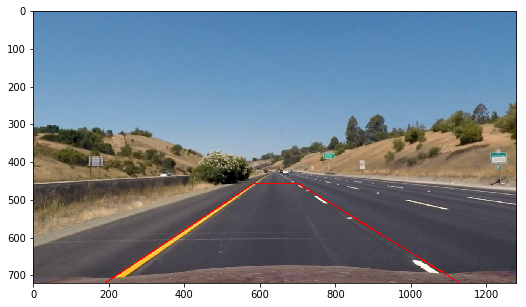

In [25]:
index = 7
img = undistorted[7].copy()
lb = [190, 720]
lt = [585, 455]
rt = [700, 455]
rb = [1130, 720]
color = [255, 0, 0]
cv2.line(img, tuple(lt), tuple(lb), color, 2)
cv2.line(img, tuple(lt), tuple(rt), color, 2)
cv2.line(img, tuple(rt), tuple(rb), color, 2)
cv2.line(img, tuple(rb), tuple(lb), color, 2)
fig, ax = plt.subplots(figsize=(10, 5))
ax.imshow(img)
plt.show()

In [26]:
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
src = np.float32([lt,rt,rb,lb])
nx = gray.shape[1]
ny = gray.shape[0]
img_size = (nx, ny)
offset = 200
dst = np.float32([
    [offset, 0],
    [nx-offset, 0],
    [nx-offset, ny], 
    [offset, ny]
])
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

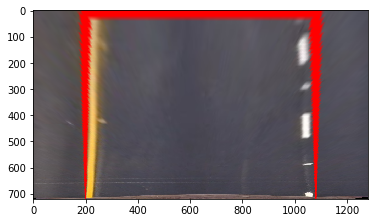

In [27]:
warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
plt.imshow(warped)
plt.show()

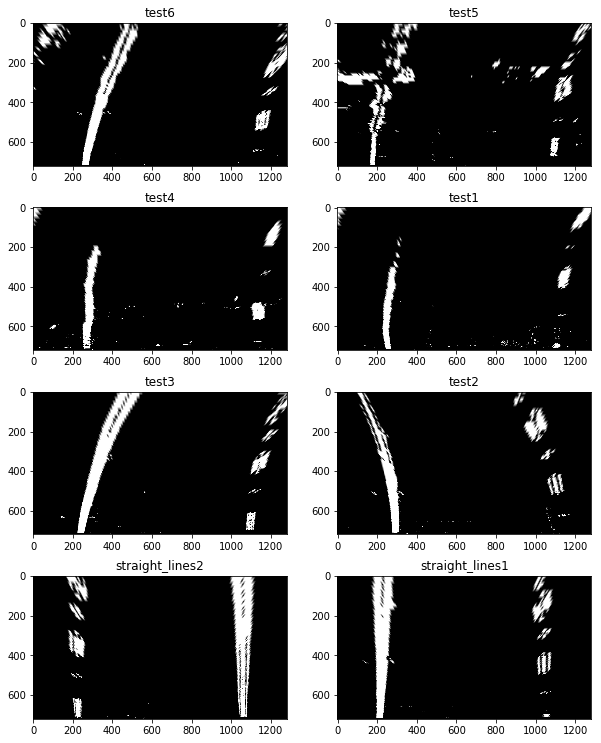

In [28]:
fig, axes = plt.subplots(4, 2, figsize=(10,13))
for ax, idx in zip(axes.flat, range(8)):
    img = thresholded_binaries[idx]
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    ax.imshow(warped, cmap='gray')
    ax.set_title(test_fnames[idx].split('/')[-1][:-4])

### Searching Lane Lines

In [29]:
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

def find_lines(img):
    b = grad_color_combine(img)
    img = np.array(np.dstack((b,b,b))*255, dtype=np.uint8)
    binary_warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    # Take a histogram of the bottom half of the image
    histogram = np.mean(np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0),axis=1)
    # Create an output image to draw on and visualize the result
    out_img = binary_warped
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 6) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 6) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Fit a second order polynomial to each lane in meters
    left_fit_m = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_m = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    return (left_fit, right_fit, left_fit_m, right_fit_m, out_img, left_lane_inds, right_lane_inds, nonzerox, nonzeroy)

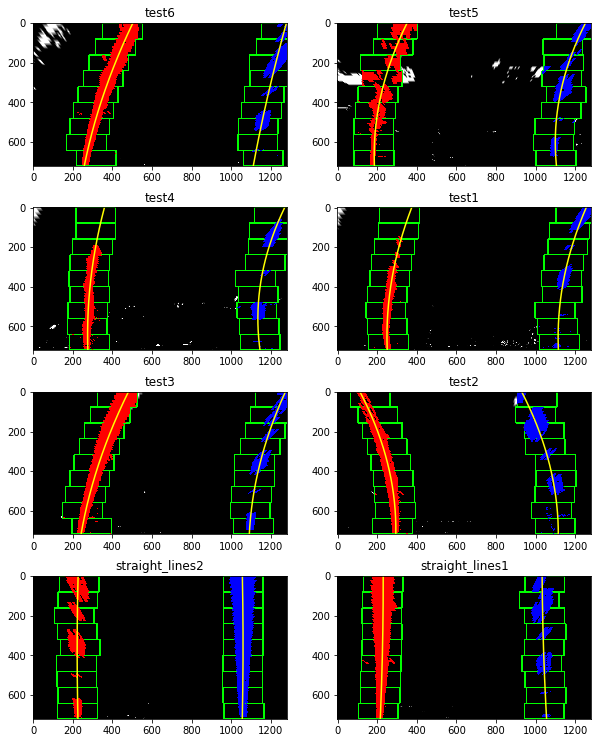

In [30]:
fig, axes = plt.subplots(4, 2, figsize=(10,13))
for ax, idx in zip(axes.flat, range(8)):
    img = undistorted[idx]
    (left_fit, right_fit, left_fit_m, right_fit_m, 
     out_img, left_lane_inds, right_lane_inds, nonzerox, nonzeroy) = find_lines(img)
    ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    ax.imshow(out_img, cmap='gray')
    ax.plot(left_fitx, ploty, color='yellow')
    ax.plot(right_fitx, ploty, color='yellow')
    ax.set_title(test_fnames[idx].split('/')[-1][:-4])

In [31]:
def find_next_lines(img, old_left_fit, old_right_fit):
    img = grad_color_combine(img)
    img = np.array(np.dstack((img,img,img))*255, dtype=np.uint8)
    binary_warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (old_left_fit[0]*(nonzeroy**2) + old_left_fit[1]*nonzeroy + 
    old_left_fit[2] - margin)) & (nonzerox < (old_left_fit[0]*(nonzeroy**2) + 
    old_left_fit[1]*nonzeroy + old_left_fit[2] + margin))) 
    
    right_lane_inds = ((nonzerox > (old_right_fit[0]*(nonzeroy**2) + old_right_fit[1]*nonzeroy + 
    old_right_fit[2] - margin)) & (nonzerox < (old_right_fit[0]*(nonzeroy**2) + 
    old_right_fit[1]*nonzeroy + old_right_fit[2] + margin)))  
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Fit a second order polynomial to each lane in meters
    left_fit_m = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_m = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    out_img = binary_warped
    return (left_fit, right_fit, left_fit_m, right_fit_m, out_img, left_lane_inds, right_lane_inds, nonzerox, nonzeroy)

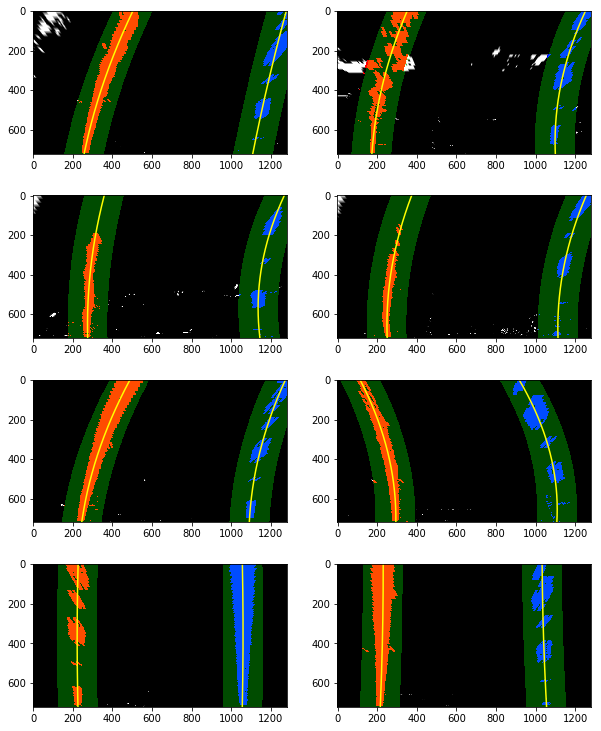

In [32]:
fig, axes = plt.subplots(4, 2, figsize=(10,13))
for ax, idx in zip(axes.flat, range(8)):
    img = undistorted[idx]
    (old_left_fit, old_right_fit, _, _, _, _, _, _, _) = find_lines(img)
    
    (left_fit, right_fit, left_fit_m, right_fit_m, out_img,
     left_lane_inds, right_lane_inds, nonzerox, nonzeroy) = find_next_lines(img, old_left_fit, old_right_fit)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    margin = 100
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    ax.imshow(result)
    ax.plot(left_fitx, ploty, color='yellow')
    ax.plot(right_fitx, ploty, color='yellow')

### Curvature

In [33]:
def curvature(fit):
    return ((1 + (2*fit[0]*719*ym_per_pix + fit[1])**2)**1.5) / np.absolute(2*fit[0])

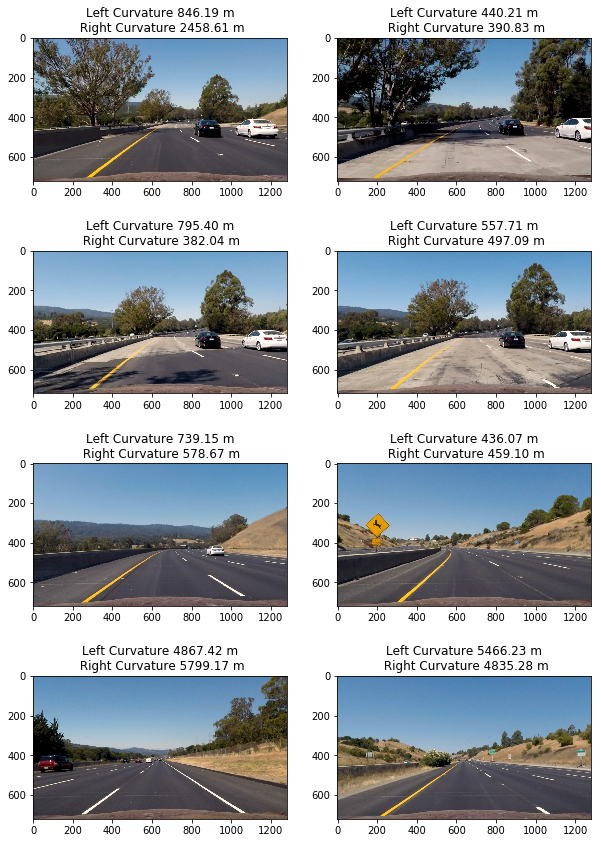

In [34]:
fig, axes = plt.subplots(4, 2, figsize=(10,15))
for ax, idx in zip(axes.flat, range(8)):
    img = undistorted[idx]
    (left_fit, right_fit, left_fit_m, right_fit_m, out_img, left_lane_inds, right_lane_inds
     , nonzerox, nonzeroy) = find_lines(img)
    left_curv = curvature(left_fit_m)
    right_curv = curvature(right_fit_m)
    ax.imshow(img, cmap='gray')
    ax.set_title('Left Curvature {:.2f} m\n Right Curvature {:.2f} m'.format(left_curv, right_curv))

### Warp the detected lane boundaries back onto the original image

In [35]:
def draw_line(img, left_fit, right_fit):
    ylen = img.shape[0]
    ploty = np.linspace(0, ylen - 1, ylen)
    color_warp = np.zeros_like(img).astype(np.uint8)
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0]))
    
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    return result

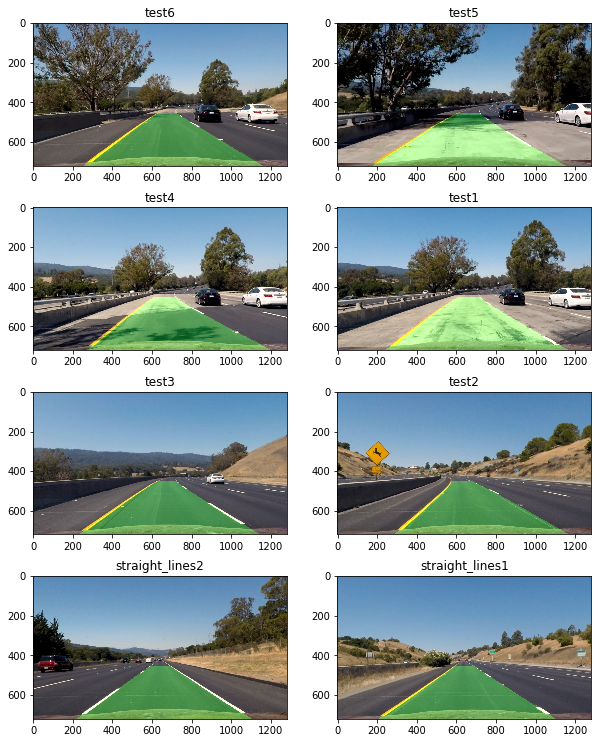

In [36]:
fig, axes = plt.subplots(4, 2, figsize=(10,13))
for ax, idx in zip(axes.flat, range(8)):
    img = undistorted[idx]
    left_fit, right_fit, _, _, _, _, _, _, _ = find_lines(img)
    ax.imshow(draw_line(img, left_fit, right_fit))
    ax.set_title(test_fnames[idx].split('/')[-1][:-4])

### Final Pipeline including Curvature and Distance from the Center

In [37]:
def pipeline(img):
    """
    Find and draw the lane lines on the image `img`.
    """
    left_fit, right_fit, _, _, _, _, _, _, _ = find_lines(img)
    _, _, left_fit_m, right_fit_m, _, _, _, _, _ = find_lines(cv2.undistort(img, mtx, dist, None, mtx))
    outImg = draw_line(img, left_fit, right_fit)
    
    # Compute curvature
    left_curv = curvature(left_fit_m)
    right_curv = curvature(right_fit_m)
    
    # Compute distance from center
    xlen = img.shape[1]*xm_per_pix
    ylen = img.shape[0]*ym_per_pix
    leftLane = left_fit_m[0]*ylen**2 + left_fit_m[1]*ylen + left_fit_m[2]
    rightLane = right_fit_m[0]*ylen**2 + right_fit_m[1]*ylen + right_fit_m[2]
    laneCenter = (rightLane - leftLane)/2 + leftLane
    carCenter = xlen / 2
    diff = laneCenter - carCenter
    if diff < 0:
        LorR = '{:.2f} m right'.format(-diff)
    else:
        LorR = '{:.2f} m left'.format(diff)
    
    # Display
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontColor = (255, 0, 0)
    cv2.putText(outImg, 'Left Curvature {:.0f} m'.format(left_curv), (30, 50), font, 2, fontColor, 6)
    cv2.putText(outImg, 'Right Curvature {:.0f} m'.format(right_curv), (30, 120), font, 2, fontColor, 6)
    cv2.putText(outImg, 'Car is {} from center'.format(LorR), (30, 190), font, 2, fontColor, 6)
    return outImg

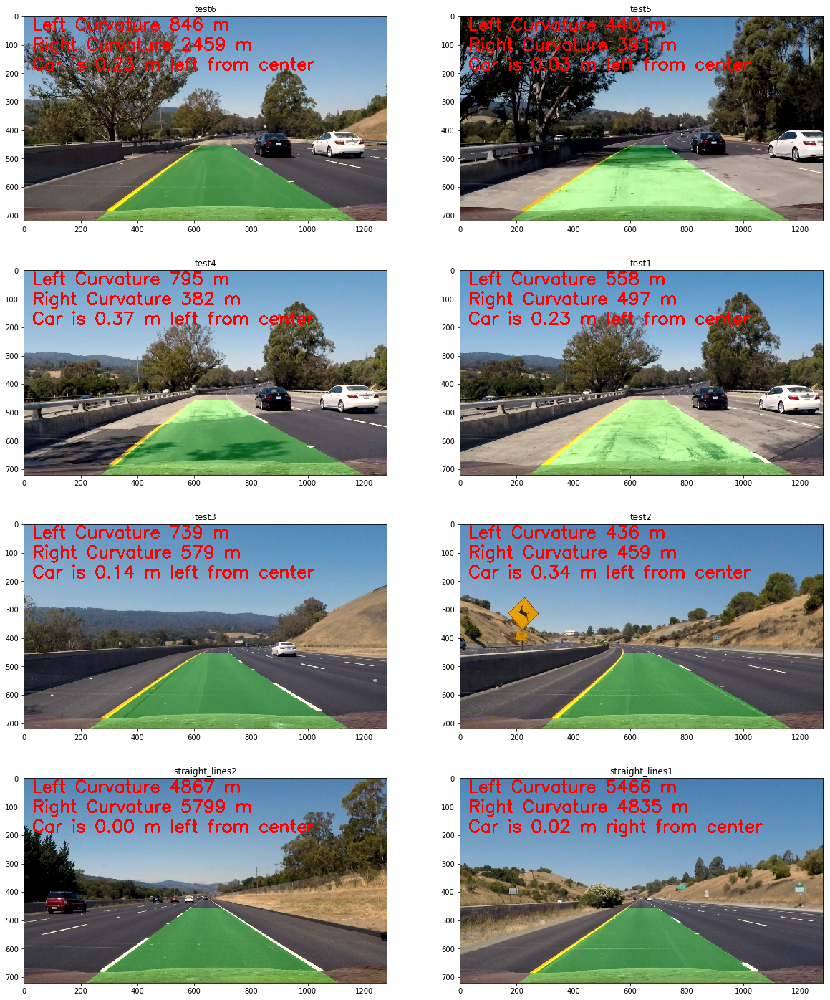

In [38]:
fig, axes = plt.subplots(4, 2, figsize=(20,25))
for ax, idx in zip(axes.flat, range(8)):
    img = cv2.imread(test_fnames[idx])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(pipeline(img))
    ax.set_title(test_fnames[idx].split('/')[-1][:-4])

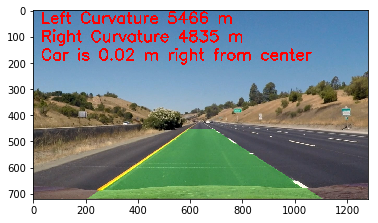

In [41]:
# Save images
for idx in range(8):
    img = cv2.imread(test_fnames[idx])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = plt.imshow(pipeline(img))
    plt.savefig('output_images/{}.jpg'.format(test_fnames[idx].split('/')[-1][:-4]+'_with_lines'), bbox_inches='tight')

In [39]:
from moviepy.editor import VideoFileClip

In [40]:
# Use this class to keep track of information in case it is hard to detect lines at some point in time
class Lane():
    def __init__(self):
        self.left_fit = None
        self.right_fit = None
        self.left_fit_m = None
        self.right_fit_m = None
        self.left_curv = None
        self.right_curv = None

def compute(img):
    left_fit, right_fit, _, _, _, _, _, _, _ = find_lines(img)
    _, _, left_fit_m, right_fit_m, _, _, _, _, _ = find_lines(cv2.undistort(img, mtx, dist, None, mtx))
    
    # Compute curvature
    left_curv = curvature(left_fit_m) 
    right_curv = curvature(right_fit_m)
    
    # Compute distance from center
    xlen = img.shape[1]*xm_per_pix
    ylen = img.shape[0]*ym_per_pix
    leftLane = left_fit_m[0]*ylen**2 + left_fit_m[1]*ylen + left_fit_m[2]
    rightLane = right_fit_m[0]*ylen**2 + right_fit_m[1]*ylen + right_fit_m[2]
    laneCenter = (rightLane - leftLane)/2 + leftLane
    carCenter = xlen / 2
    diff = laneCenter - carCenter
    
    return (left_fit, right_fit, left_fit_m, right_fit_m, left_curv, right_curv, diff)
    
myclip = VideoFileClip('project_video.mp4')

leftLane = Lane()
rightLane = Lane()

def processImage(img):
    left_fit, right_fit, left_fit_m, right_fit_m, left_curv, right_curv, diff = compute(img)
    
    if left_curv > 5500:
        # Use previous fit parameter and curvature
        left_fit = leftLane.left_fit
        left_fit_m = leftLane.left_fit_m
        left_curv = leftLane.left_curv
    else:
        # Update fit parameter and curvature
        leftLane.left_fit = left_fit
        leftLane.left_fit_m = left_fit_m
        leftLane.left_curv = left_curv
    
    if right_curv > 5500:
        # Use previous fit parameter and curvature
        right_fit = rightLane.right_fit
        right_fit_m = rightLane.right_fit_m
        right_curv = rightLane.right_curv
    else:
        # Update fit parameter and curvature
        rightLane.right_fit = right_fit
        rightLane.right_fit_m = right_fit_m
        rightLane.right_curv = right_curv
    
    outImg = draw_line(img, left_fit, right_fit)

    if diff < 0:
        LorR = '{:.2f} m right'.format(-diff)
    else:
        LorR = '{:.2f} m left'.format(diff)

    # Display
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontColor = (255, 0, 0)
    cv2.putText(outImg, 'Left curvature: {:.0f} m'.format(left_curv), (30, 50), font, 2, fontColor, 6)
    cv2.putText(outImg, 'Right curvature: {:.0f} m'.format(right_curv), (30, 120), font, 2, fontColor, 6)
    cv2.putText(outImg, 'Car is {} from center'.format(LorR), (30, 190), font, 2, fontColor, 6)
    return outImg

clip = myclip.fl_image(processImage)
clip.write_videofile('video_output.mp4', audio=False)

[MoviePy] >>>> Building video video_output.mp4
[MoviePy] Writing video video_output.mp4


100%|█████████▉| 1260/1261 [11:04<00:00,  2.00it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_output.mp4 

